# Optimization

The next topic we are going to cover is also part of calculus: Optimization. Optimization problems are problems in which you are trying to find the maximum or minimum of a function. Optimization problems are very common in real world applications. Businesses are often trying to maximize profits or minimize costs. Engineers may want to design something in a way that maximizes efficiency or output. Next week we will see examples where we wanted to minimize error to find a least-squares fit.

The function that you are trying to maximize or minimize is called the *objective function*. The objective function can be a function of one variable or it can be a function of several variables (or equivalently a vector). To start, we will talk about functions of one variable. There are two types of optimization problems. Sometimes, we allow for any value of $x$. In that case, we call it an unconstrained optimization problem. There are other times in which we only allow for certain values of $x$. These restrictions on possible values of $x$ are called constraints and we call the problem a constrained optimization problem. An example would be a manufacturer trying to decide how many items to make in order to maximize profit. There may be constraints in the form of limited supplies or limited labor hours. We will only talk about unconstrained optimization problems in this class.

When talking about minimization of a function $f(x)$, there are two things you
can be talking about.
 - Finding the minimum value of the function, $\min_x f(x)$, which is the smallest value the function takes on. E.g. for $f(x) = (x-1)^2$, $\min_x f(x) = 0$. $\min_x f(x) = \bar f$ means that $\bar f \leq f(x)$ for all $x$.
 -  Finding the argument (here, the $x$-value) that minimizes the function, or $\text{argmin}_x f(x)$ (sometimes the argmin is also called the *minimizer* of the function). For the previous example, $f(x) = (x-1)^2$, we have $\text{argmin}_x f(x) = 1$ because $f(1) = 0 = \min_x f(x)$. $\text{argmin}_x f(x) = y$ means that $f(y)< f(x)$ for all $x \neq y$.


Our focus is going to be entirely on finding the argmin. That's because once
you find the argmin, you can plug this back into the function to find the
minimum. All minimization algorithms are designed like this, to find the
argmin.

Why have we only discussed minimization, what about maximization?  For all of
the methods that we learn, we are going to be focused on minimizing the
objective function. This is sufficient because to maximize a function, you can
just minimize the negative of the function. By deciding on a convention, it's easier to compare algorithms. When maximizing, it is important to note that the minimizer is the same as the *maximizer* (or the argmin = argmax), but the maximum value is not the same. You need to take the negative of what you find to get the max value from a minimization algorithm.

For example, consider trying to find the maximum of $g(x) = -x^2 + 3$.

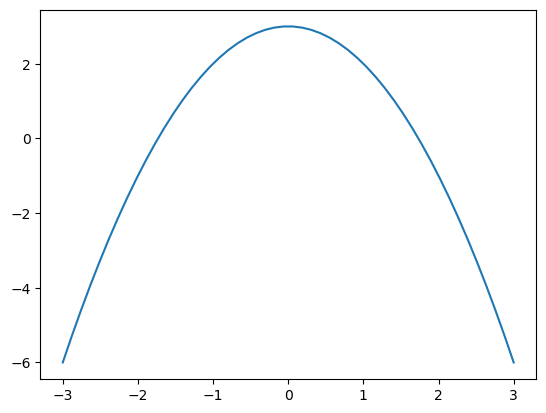

In [1]:
import numpy as np
import matplotlib.pyplot as plt
xplot = np.linspace(-3, 3)
g = lambda x: -x**2 + 3
plt.plot(xplot, g(xplot))

To find the maximum, we can consider another function $h(x) = -g(x)$ and find the minimum of that:

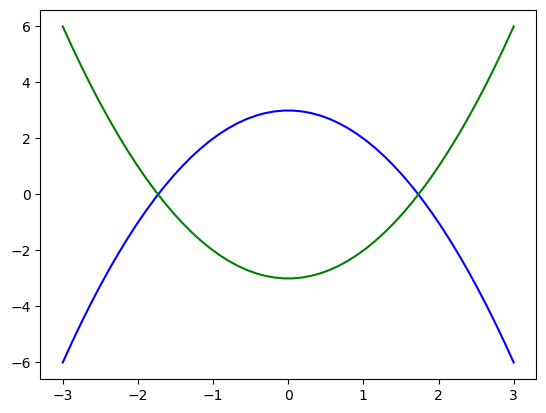

In [2]:
h = lambda x: -g(x)
plt.plot(xplot, g(xplot), 'b')
plt.plot(xplot, h(xplot), 'g')

From calculus we know that $\text{argmin}_x h(x) = 0$. 

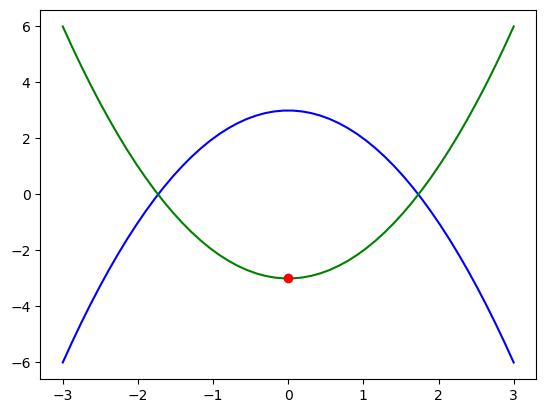

In [3]:
h = lambda x: -g(x)
plt.plot(xplot, g(xplot), 'b')
plt.plot(xplot, h(xplot), 'g')
plt.plot([0], h(0) , 'ro')

But this is also obviously $\text{argmax}_x g(x)$:

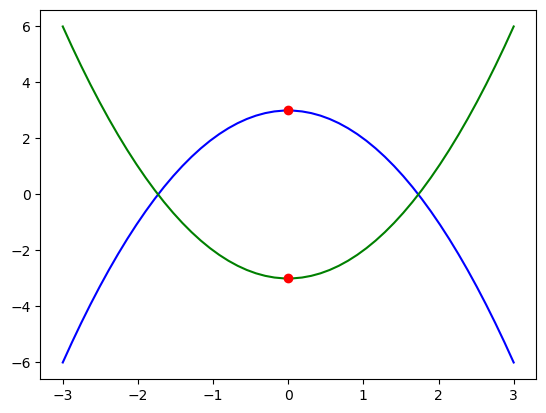

In [4]:
h = lambda x: -g(x)
plt.plot(xplot, g(xplot), 'b')
plt.plot(xplot, h(xplot), 'g')
plt.plot([0], h(0) , 'ro')
plt.plot([0], g(0), 'ro')

And we can see that

In [5]:
g(0) == -h(0)

True

### Derivative-Free methods
You know about optimization from Calculus. In Calculus you take a derivative and set it equal to zero. Usually when we are doing optimization we can't take a derivative of the function. It is possible to approximate the derivative using one of the methods we've talked about in this class and then find the minimum of that, but usually it's a bad idea to introduce new error. Instead, we focus on "derivative-free" methods, meaning that we find the minimum without derivatives.

The two most relevant methods for 1-dimensional optimization are called *Golden-Section Search* and *Successive Parabolic Interpolation*. I will give some information below on Golden-Section Search, but we won't be covering it fully in class so I will provide a supplementary Jupyter notebook for those that are interested. 

*Golden-Section Search* and *Successive Parabolic Interpolation* are combined to form a built-in optimization method: `scipy.optimize.fminbound`. Here's an example for how it works.

(-4.0, -1.0)

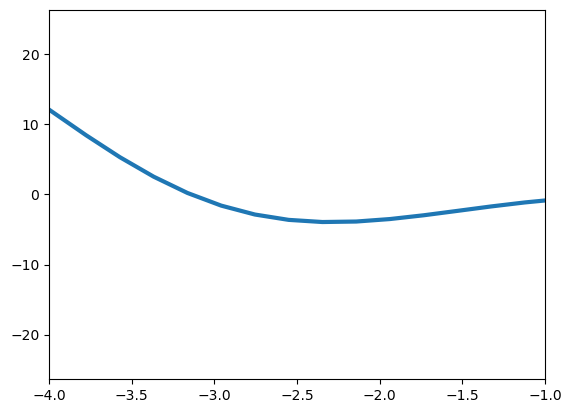

In [6]:
# First plot the function
f = lambda x: x**2*np.sin(x)
xplot = np.linspace(-5,5)
plt.plot(xplot, f(xplot), lw=3, label=r"x^2 sin(x)")
plt.xlim([-4, -1])

In [7]:
# Then find the minimizer
import scipy.optimize
argminx = scipy.optimize.fminbound(f, -4, -1) # Syntax is fminbound(function, left_bound, right_bound)
# Print them to see
print(argminx)
print(f(argminx))

-2.2889297246021365
-3.9453016252843254


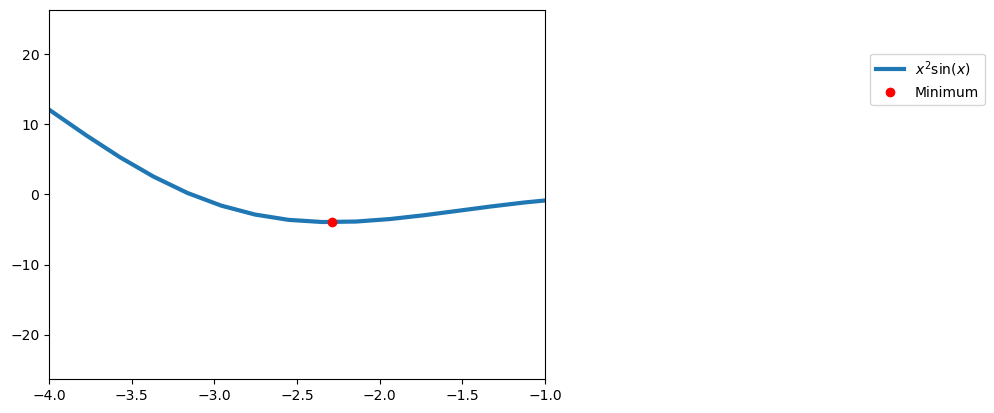

In [8]:
# Put it on the plot
plt.plot(xplot, f(xplot), lw=3, label=r"$x^2 \sin(x)$")
plt.xlim([-4, -1])
plt.plot(argminx, f(argminx), 'ro', label='Minimum')

# I want to show you how to put the legend outside of the figure
plt.legend(bbox_to_anchor=(1.9, 0.9))

Instead of thinking about the 1D optimization problems, we are going to work on something cooler: optimization in higher dimensions. This allows us to talk about one of the most important algorithms of our time.

### The Gradient-Descent algorithm

Gradient descent is a method that can find the minimum of functions of multiple
variables. So we can have a function $f(x,y)$ of two variables, a function
$f(x,y,z)$ of three variables, or a function $f(x_1,x_2,...,x_n)$ of $n$
variables. Before talking about the basic idea of the algorithm, I want to talk
about working with and visualizing functions of multiple variables. First note
that, mathematically, functions of multiple variables are just like functions
of one variable: you plug in the independent variables (e.g. $x$ and $y$ into
$f(x,y)$) and it gives you a dependent variable (a number) out, $z = f(x,y)$.
You also visualize this function in the same way. Except now what is "below"
isn't the real line as it is for $y = f(x)$, it is $\mathbb{R}^2$, or the $(x,y)$ plane.
Above the $(x,y)$ plane you now have a value at every $(x,y)$ pair. This gives
a sheet, or something that looks two dimensional! Indeed, a curve, e.g., $y =
x^2$ is one-dimensional because you only need one thing to define it: $x$. A
*surface* is two dimensional because you need two things to define it:
$(x,y)$. (Note though that you can only observe these things *embedded* in
one dimension higher, like we view a curve in the $(x,y)$ plane). An example of
such a plot is below:
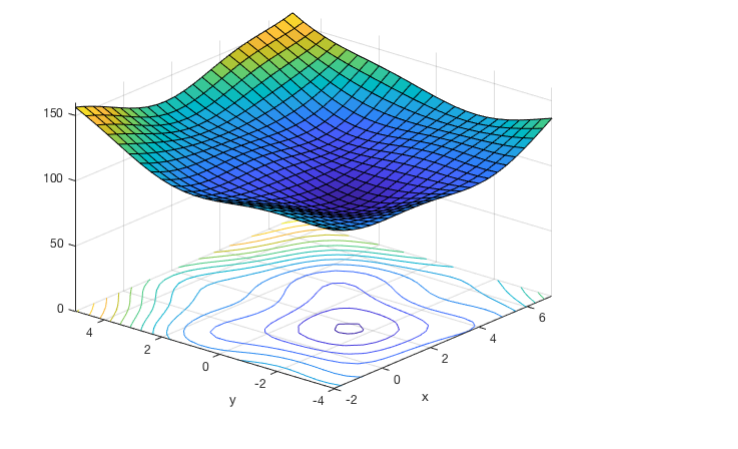
We will talk more about these plots soon, so everything will make sense on this
figure eventually. We will talk about making these plots on Friday. 

The basic idea behind gradient descent is simple. Let's say you
have a function of two variables, $f(x,y)$. The graph of that function is a
surface. We want to find the lowest point on the surface. You start with an
initial guess and then move downhill in some direction. Then you look for
another direction to head downhill. You repeat this until you reach the bottom.

Even though the idea behind the method is simple and intuitive, the
implementation can be difficult. Therefore, we are going to spend the rest of
the week (including the activity) digging into the details of gradient descent.
To prepare for this, we need to talk about the *gradient*, which
is the main mathematical tool used for the method. When we have a function of
one variable, $f(x)$, the derivative tells us if the function is increasing or
decreasing. The analog of this for functions of multiple variables is the
gradient. For multidimensional functions, you can now have *directions of increase or decrease*. To see this, we will talk about a hiking contour map.

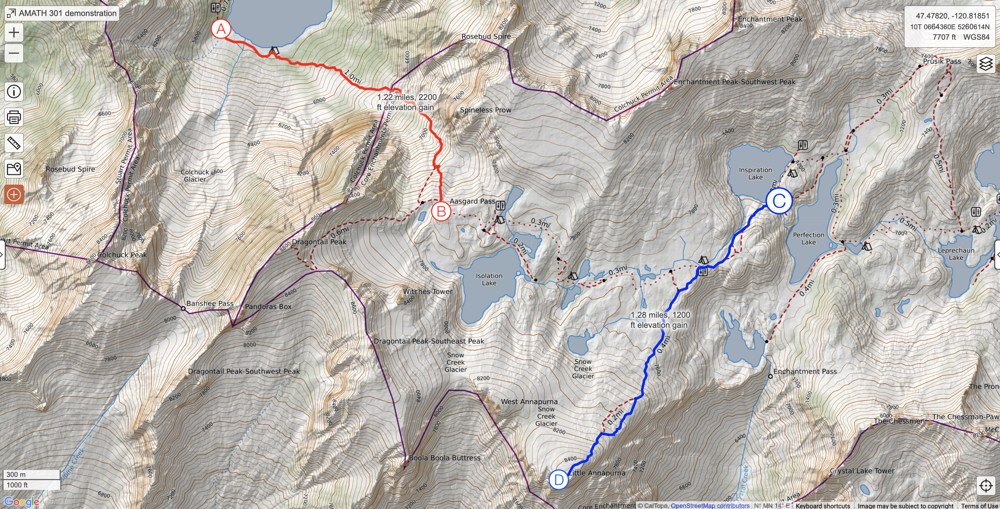

Before we start thinkin about the particular locations on the map, we need to understand how contour maps work. This is also how we will visualize functions in this class (see the example above). In this picture we have lakes and peaks. The peaks are generally above the lakes. For instance, there is a valley containing the lakes "Isolation Lake" and a myriad of other lakes. Above it are some peaks: "Little Anapurna", "West Annapurna", "Boola Boola Buttress", "Dragontail Peak", etc. We can see that the. peaks are above the lake because of the labeling of the contour lines, but also this matches our intuition because water flows downhill (important idea, because that is the idea behind gradient descent). Contour lines are included in the map showing *lines of constant elevation*. 

We can tell which areas are steepest on the map by considering the two routes I have labeled: from A to B in red and from C to D in blue. From A to B the distance (horizontal distance) is 1.22 miles. Over that 1.22 miles, 2200 feet of elevation are gained. From C to D the distace is 1.28 miles, but only 1200 feet of elevation are gained. Obviously the route from A to B is steeper than the route from C to D *on average*. How can we see this on the map? **The contour lines are closer** together. The idea is that when contour lines are farther apart where it's flat (because that means that there is less elevation change in the same horizontal distance) and closer together where it's steep (more elevation gain in a small horizontal distance). We can see that the contour lines are much closer together on the red route. We can also see where there are cliffs, West and Northwest of point B, and where there are flat parts: part way up the blue route. 

Let's think about the four locations I have marked on this map: A, B, C, and D. Let's first think about D. If I were to ask you: at the point D, are we moving uphill or downhill? In order to know that, you need to know which direction you are moving. If you are standing on D, you can rotate around and see infinitely many directions. One direction may be straight up, another down, and then there's also directions where you would stay at the same elevation if you walked that way, in particular in the direction of the contour lines. The direction that points up the most (the steepest direction) is the direction of the *gradient vector*. The direction of the contour line, where you do not change any elevation at all, is *perpendicular to the gradient vector*. In the activity on Wednesday there will be some examples of gradient vectors. You won't need to compute any by hand. We'll pick up there on Wednesday.